# Step 3: refine clusters

In [1]:
.libPaths(new=c('/home/jthomp02/R410_manual', '/home/jthomp02/miniconda3/envs/Rv4_1/lib/R/library'))
suppressPackageStartupMessages({
    library(Seurat)
    library(ggplot2)
    library(dplyr)
    library(edgeR)
})

In [2]:
sro_filt <- readRDS(here("processed-data","sro_filt_shortcut.rda"))

In [3]:
sro_filt <- RunPCA(sro_filt)
sro_filt <- RunUMAP(sro_filt, reduction = "pca", dims = 1:20, return.model = TRUE)

PC_ 1 
Positive:  Cst3, Apoe, Ptn, Aldoc, Plpp3, Slc1a3, Clu, Atp1a2, Slc1a2, Htra1 
	   Glul, Id3, Gpr37l1, Pla2g7, Hopx, Dbi, Mt1, Bcan, Gja1, Aqp4 
	   Cspg5, Ptprz1, Ntsr2, Sparc, Sparcl1, Cldn10, Mfge8, Prdx6, Id4, Fabp7 
Negative:  Nrgn, Igfbpl1, Sox11, Meg3, Tmsb10, C1ql3, Stmn1, Calb2, Olfm1, Stmn2 
	   Tubb3, Rtn1, Neurod1, Calb1, Chn1, Sox4, Nefl, Pcp4, Zbtb20, Ppp3ca 
	   Nnat, Bhlhe22, Map1b, Tuba1a, Snca, Camk2b, Cplx2, Calm2, Basp1, Camk2a 
PC_ 2 
Positive:  Aldoc, Plpp3, Slc1a3, Clu, Ptn, Slc1a2, Atp1a2, Htra1, Gpr37l1, Pla2g7 
	   Mt1, Hopx, Apoe, Gja1, Cspg5, Bcan, Aqp4, Ptprz1, Dbi, Sparcl1 
	   Ntsr2, Id3, Cldn10, Prdx6, Id4, Mfge8, Fabp7, Mt3, Ttyh1, Glul 
Negative:  Tyrobp, C1qa, C1qb, C1qc, Ctss, Csf1r, Fcer1g, Laptm5, Cx3cr1, Ly86 
	   Trem2, Hexb, Fcrls, Sparc, P2ry12, Rgs10, Gpr34, Selplg, Siglech, Lgmn 
	   Ctsd, Olfml3, Selenop, Rnase4, Tmem119, Aif1, Fcgr3, Unc93b1, Ltc4s, Cyba 
PC_ 3 
Positive:  Nrgn, C1ql3, Calb1, Nefl, Chn1, Atp1b1, Camk2n1, Olfm1, Meg3, 

In [33]:
coldf <- read.csv(here("tools","high_n_color_palette.csv"))
cp <- coldf$color

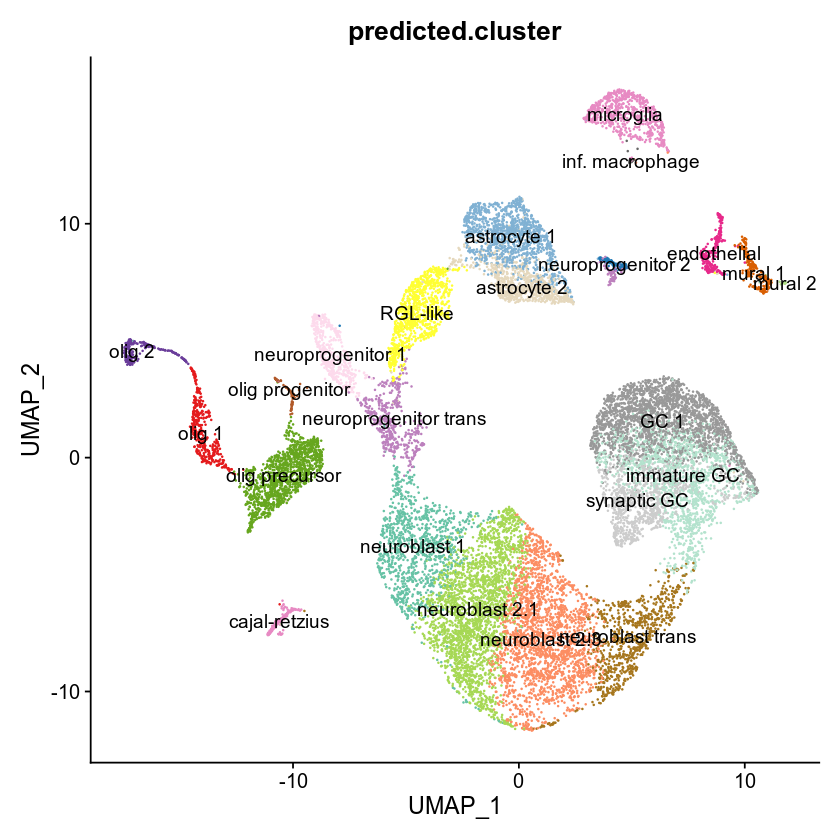

In [5]:
options(repr.plot.width=7, repr.plot.height=7)
DimPlot(object = sro_filt, reduction = "umap", group.by = "predicted.cluster",
        label=TRUE)+NoLegend()+
scale_color_manual(values=c(as.character(cp),as.character(cp)[1:18]))

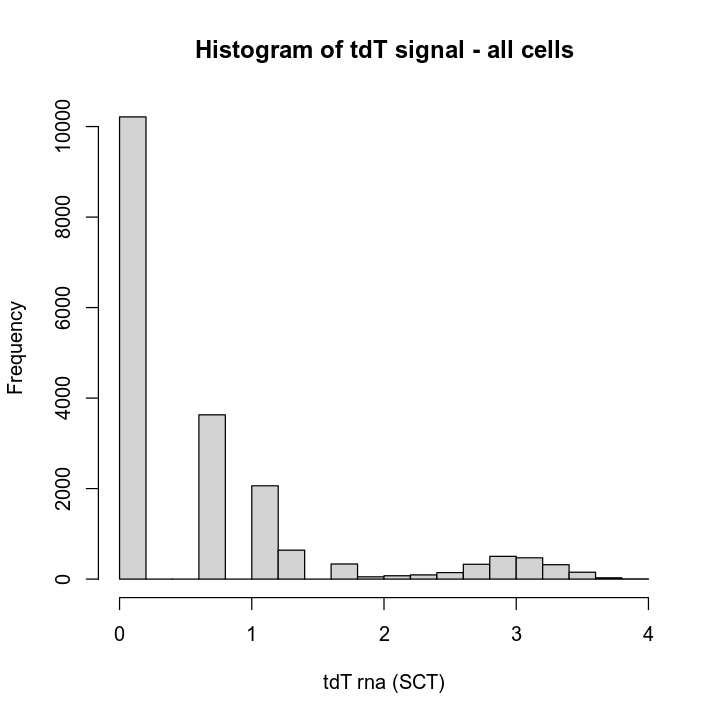

In [29]:
hist(sro_filt$SCT@data["tdt",], main="Histogram of tdT signal - all cells", xlab="tdT rna (SCT)")

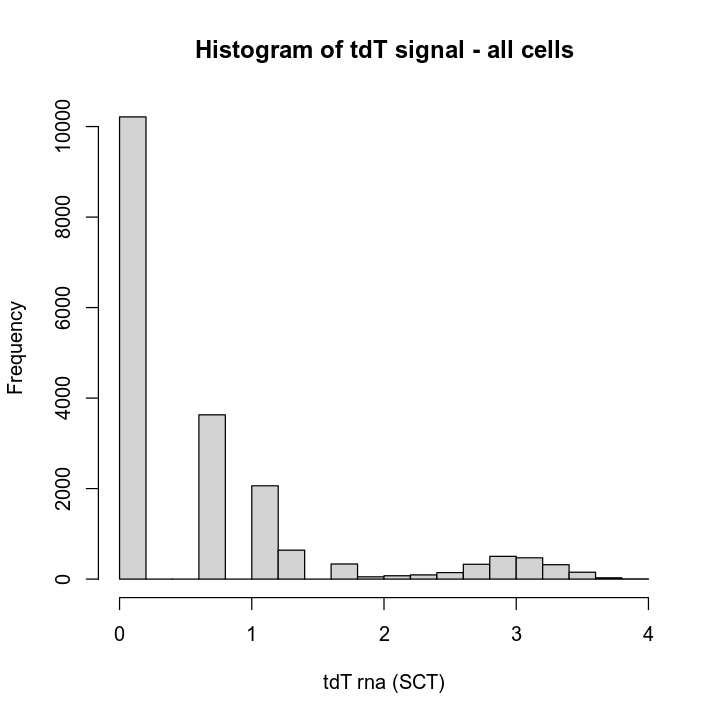

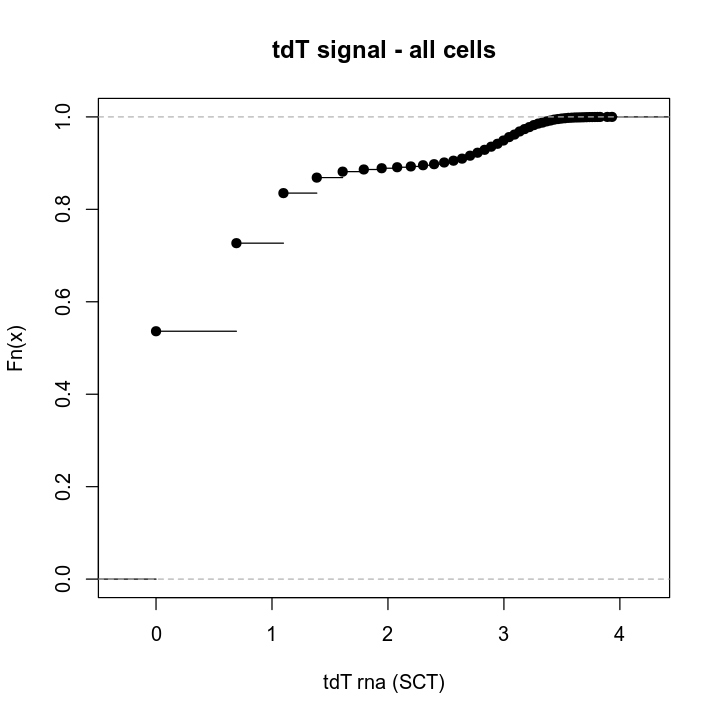

In [28]:
options(repr.plot.width=6, repr.plot.height=6)
hist(sro_filt$SCT@data["tdt",], main="Histogram of tdT signal - all cells", xlab="tdT rna (SCT)", breaks=20)
plot(ecdf(sro_filt$SCT@data["tdt",]), main="tdT signal - all cells", xlab="tdT rna (SCT)")

In [52]:
fun1 <- ecdf(sro_filt$SCT@data["tdt",])
ecdf.df = as.data.frame(cbind("fnx"=fun1(sro_filt$SCT@data["tdt",]),"tdT_raw"=sro_filt$SCT@data["tdt",])) %>%
group_by(fnx) %>% summarise(tdT_expr=min(tdT_raw), n_cells=n())
write.csv(ecdf.df, "out_for_alex/tdT-ecdf_x_y_values.csv")

In [37]:
summary(ecdf(sro_filt$SCT@data["tdt",]))

Empirical CDF:	  48 unique values with summary
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   2.545   3.198   2.933   3.590   3.932 

In [39]:
str(summary(ecdf(sro_filt$SCT@data["tdt",])))

 'summary.ecdf' Named num [1:6] 0 2.54 3.2 2.93 3.59 ...
 - attr(*, "names")= chr [1:6] "Min." "1st Qu." "Median" "Mean" ...
 - attr(*, "header")= chr "Empirical CDF:\t  48 unique values with summary\n"


In [7]:
sro_filt <- AddMetaData(sro_filt, metadata=sro_filt$SCT@data["tdt",]>=2, col.name="tdT")

In [14]:
srt_edgeR <- DGEList(counts= sro_filt[['SCT']]@counts, samples=as.data.frame(sro_filt@meta.data))
srt_edgeR_cpm <- cpm.DGEList(srt_edgeR, normalized.lib.sizes= FALSE, log=FALSE)
srt_edgeR_cpm_lg2 <- log2(srt_edgeR_cpm+1)

norm <- CreateAssayObject(counts = srt_edgeR_cpm)
sro_filt[['CPM']] <- norm

lg <- CreateAssayObject(counts = srt_edgeR_cpm_lg2)
sro_filt[['logcounts']] <- lg
DefaultAssay(sro_filt) <- "logcounts"
#DefaultAssay(sh_seurat_filt) <- "CPM"

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 3.0 GiB”


In [15]:
submission.mdata = sro_filt@meta.data[,c("sample","age","nCount_RNA","nFeature_RNA","doublet_score","predicted_doublet","mt_frac","predicted.cluster","tdT")]

##### Some submission data files were produced here

In [17]:
write.csv(sro_filt[['RNA']]@counts,"/home/upstate/LinLab-NGS_data/submission_data_GEO_Aug2023/mergedSamples_filteredCells_RNA_counts.csv")
write.csv(sro_filt[['SCT']]@data,"/home/upstate/LinLab-NGS_data/submission_data_GEO_Aug2023/mergedSamples_filteredCells_SCT_counts.csv")
write.csv(sro_filt[['CPM']]@counts,"/home/upstate/LinLab-NGS_data/submission_data_GEO_Aug2023/mergedSamples_filteredCells_CPM_counts.csv")
write.csv(sro_filt[['logcounts']]@counts,"/home/upstate/LinLab-NGS_data/submission_data_GEO_Aug2023/mergedSamples_filteredCells_log2CPMp1_counts.csv")
write.csv(submission.mdata, "/home/upstate/LinLab-NGS_data/submission_data_GEO_Aug2023/mergedSamples_filteredCells_cell_metadata.csv")

In [2]:
saveRDS(sro_filt, here("processed-data","sro_filt_norm.rda"))

In [3]:
dim(sro_filt[['RNA']]@counts)

[1] 21881 19047

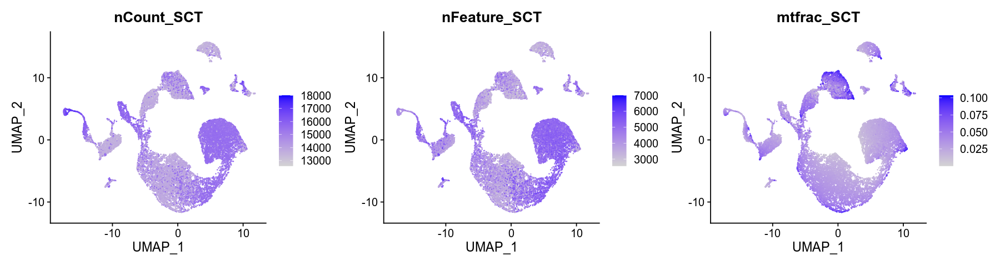

In [19]:
# qc umap plots
options(repr.plot.width=15, repr.plot.height=4)
FeaturePlot(object = sro_filt, reduction = "umap", 
            features=c("nCount_SCT","nFeature_SCT","mtfrac_SCT"), ncol=3)

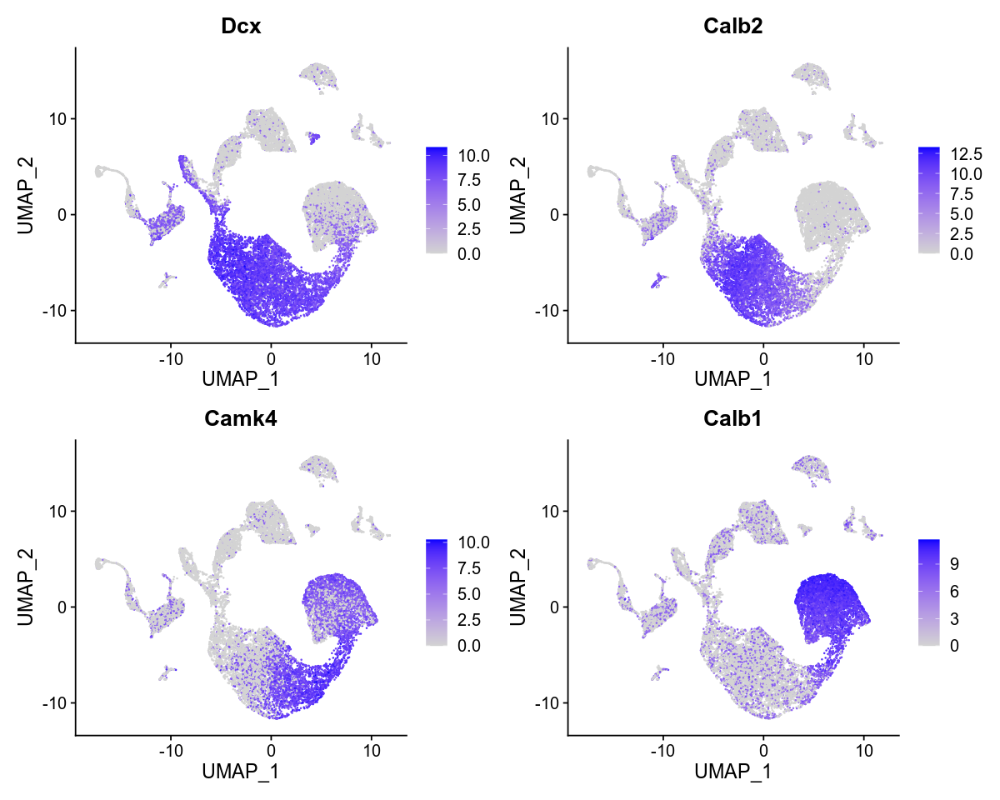

In [20]:
#neuron markers
options(repr.plot.width=10, repr.plot.height=8)
FeaturePlot(object = sro_filt, reduction = "umap", features=c("Dcx","Calb2","Camk4","Calb1"), ncol=2)

In [4]:
truncfeaturelist <- c("C1qb","C1qa","Cx3cr1", # microglia
                      "Vtn","Pdgfrb", # mural
                      "Col4a2","Pecam1", # endothelial
                      "Hopx", # astrocytes & RGL
                      "Aqp4","Aldh1l1", # astrocytes
                      "Mog", # myelin producing
                      "Plp1","Olig1", # olig
                      "Olig2","Pdgfra", # olig precursor
                      "Hist1h2ap","Hist1h1b","Mki67", "Cenpf","Hmgb2",# neuroprogenitor
                      "Eomes","Dcx","Tubb3","Gap43","Stmn2","Calb2","Nav1","Gal", #neuroblasts
                      "Fxyd7",# immature GC
                      "Hpca","Nefl","Calb1", # neurons (Calb1)
                      "Bdnf","Tdo2","Ntng1","Nefm",
                      "Reln","Cacna2d2" # cajal-retzius
                    )

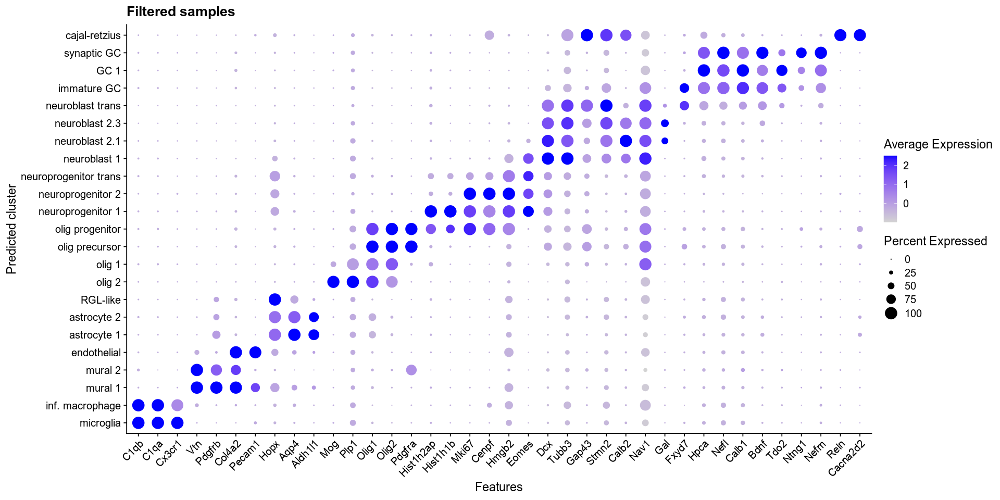

In [23]:
options(repr.plot.width=16, repr.plot.height=8)
DotPlot(sro_filt, features=truncfeaturelist, group.by="predicted.cluster")+
theme(axis.text.x=element_text(angle=45, hjust=1))+ggtitle("Filtered samples")+labs(y="Predicted cluster")#+
#coord_flip()

In [6]:
clist = levels(sro_filt@meta.data$predicted.cluster)
names(clist) = clist
clist.cells = lapply(clist, function(x) rownames(filter(sro_filt@meta.data, predicted.cluster==x)))

In [17]:
clist.perc = lapply(clist.cells, function(x) rowSums(sro_filt[['logcounts']][truncfeaturelist,x]>0)/length(x))
mtx.perc = do.call(cbind, clist.perc)

In [16]:
clist.avg = lapply(clist.cells, function(x) rowMeans(sro_filt[['logcounts']][truncfeaturelist,x])) 
mtx.avg = do.call(cbind, clist.avg)

In [18]:
write.csv(mtx.perc, here("results","cluster_dotplot_perc.csv"))
write.csv(mtx.avg, here("results","cluster_dotplot_avg-log2-CPM.csv"))

In [24]:
Idents(sro_filt) <- "predicted.cluster"
gcs <- WhichCells(sro_filt, idents=c("immature GC","GC 1","synaptic GC","neuroblast trans"))
sro_gcs <- sro_filt[,gcs]
sro_gcs

An object of class Seurat 
84716 features across 5562 samples within 4 assays 
Active assay: logcounts (20945 features, 0 variable features)
 3 other assays present: RNA, SCT, CPM
 2 dimensional reductions calculated: pca, umap

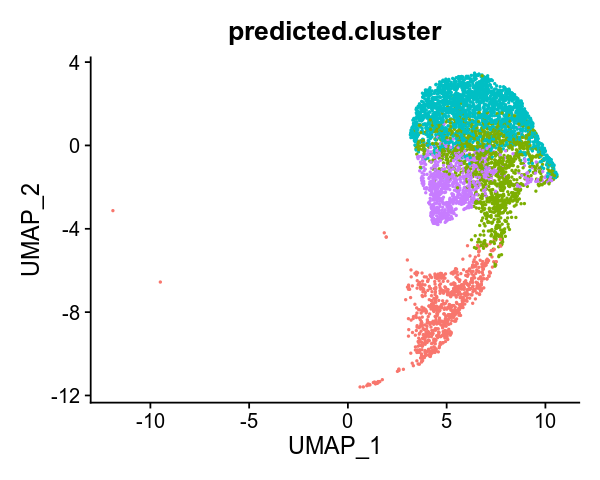

In [25]:
options(repr.plot.width=5, repr.plot.height=4)
DimPlot(object = sro_gcs, reduction = "umap", group.by = "predicted.cluster",
        label=FALSE)+NoLegend()

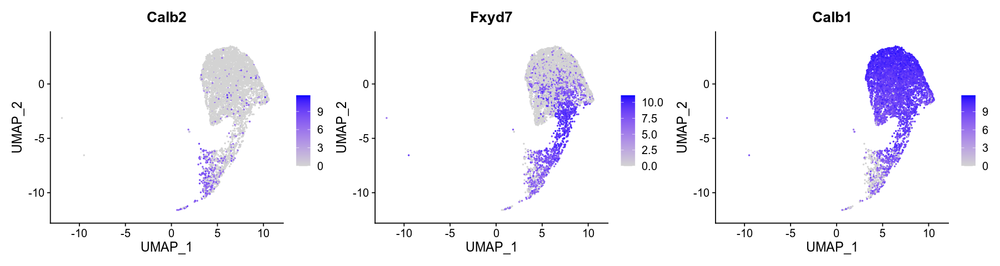

In [26]:
options(repr.plot.width=15, repr.plot.height=4)
FeaturePlot(object = sro_gcs, reduction = "umap", features=c("Calb2","Fxyd7","Calb1"),ncol=3)

In [27]:
umap_mtx <- as.matrix(sro_gcs@reductions$umap@cell.embeddings)
include <- rownames(as.data.frame(umap_mtx) %>% filter(UMAP_1> 2))
sro_gcs = sro_gcs[,include]

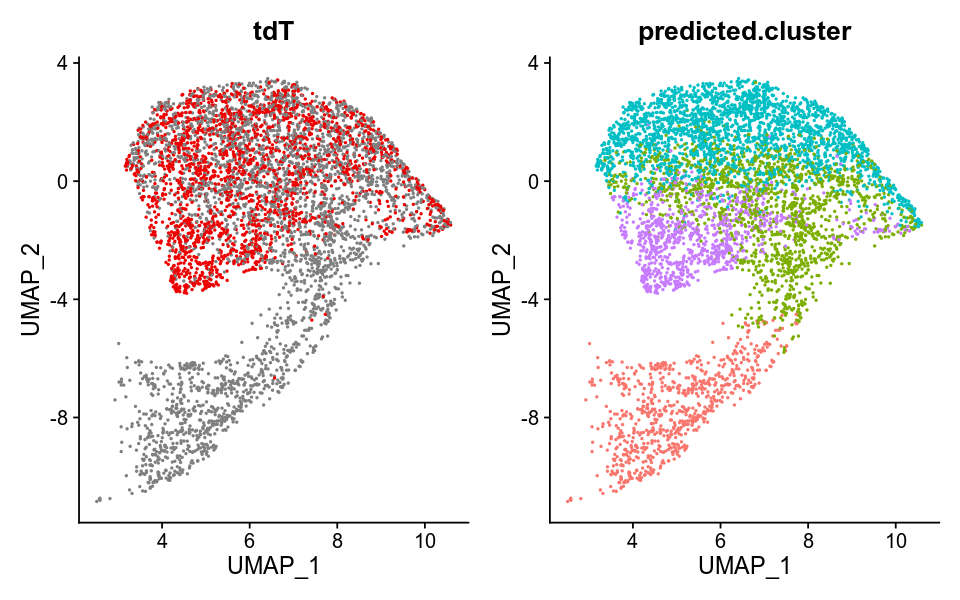

In [29]:
options(repr.plot.width=8, repr.plot.height=5)
p1 <- DimPlot(object = sro_gcs, reduction = "umap", group.by = "tdT",
        label=FALSE, cols=c("grey50","red2"))+NoLegend()
p2 <- DimPlot(object = sro_gcs, reduction = "umap", group.by = "predicted.cluster",
        label=FALSE)+NoLegend()
p1|p2

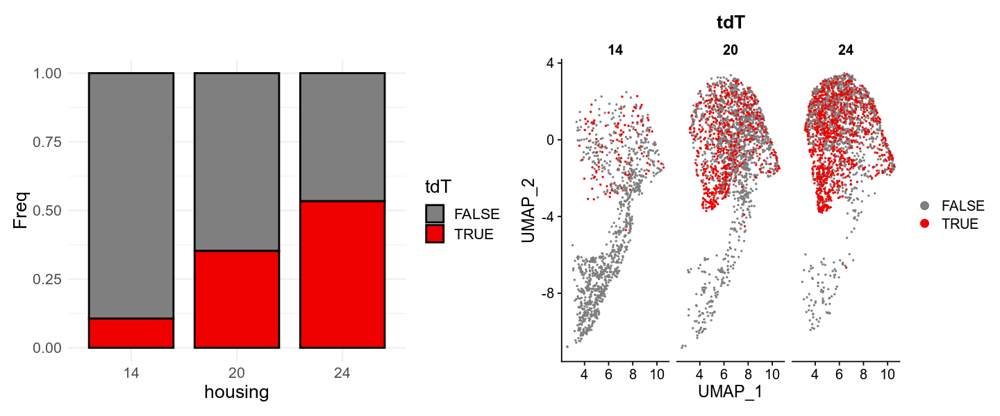

In [31]:
options(repr.plot.width=12, repr.plot.height=5)
df1 <- as.data.frame(table(sro_gcs@meta.data[,c("tdT","Age_group")]))
p1 <- ggplot(df1, aes(x=Age_group, y=Freq, fill=tdT))+
geom_bar(stat="identity", position="fill", color="black", size=.8, width=.8)+
scale_fill_manual(values=c("grey50","red2"))+
#facet_grid(cols=vars(Age_group))+
labs(x="housing")+
theme_minimal()+
theme(text=element_text(size=16))

p2 <- DimPlot(object = sro_gcs, reduction = "umap", group.by="tdT", split.by=c("Age_group"), cols=c("grey50","red2"))#,
p1|p2

In [32]:
table(sro_gcs@meta.data[,c("Age_group")])
table(sro_gcs@meta.data[,c("Age_group", "tdT")])
table(sro_gcs@meta.data[,c("predicted.cluster")])
table(sro_gcs@meta.data[,c("predicted.cluster", "tdT")])


  14   20   24 
1134 2048 2355 

         tdT
Age_group FALSE TRUE
       14  1013  121
       20  1326  722
       24  1098 1257


            microglia       inf. macrophage               mural 1 
                    0                     0                     0 
              mural 2           endothelial           astrocyte 1 
                    0                     0                     0 
          astrocyte 2              RGL-like                olig 2 
                    0                     0                     0 
               olig 1        olig precursor       olig progenitor 
                    0                     0                     0 
    neuroprogenitor 1     neuroprogenitor 2 neuroprogenitor trans 
                    0                     0                     0 
         neuroblast 1        neuroblast 2.1        neuroblast 2.3 
                    0                     0                     0 
     neuroblast trans           immature GC                  GC 1 
                  780                  1521                  2332 
          synaptic GC         cajal-retzius 
                

                       tdT
predicted.cluster       FALSE TRUE
  microglia                 0    0
  inf. macrophage           0    0
  mural 1                   0    0
  mural 2                   0    0
  endothelial               0    0
  astrocyte 1               0    0
  astrocyte 2               0    0
  RGL-like                  0    0
  olig 2                    0    0
  olig 1                    0    0
  olig precursor            0    0
  olig progenitor           0    0
  neuroprogenitor 1         0    0
  neuroprogenitor 2         0    0
  neuroprogenitor trans     0    0
  neuroblast 1              0    0
  neuroblast 2.1            0    0
  neuroblast 2.3            0    0
  neuroblast trans        778    2
  immature GC            1391  130
  GC 1                   1102 1230
  synaptic GC             166  738
  cajal-retzius             0    0

In [19]:
saveRDS(sro_gcs, here("processed-data","sro_gcs.rda"))

In [23]:
gc.tdt.df = as.data.frame(table(sro_gcs@meta.data[,c("tdT","Age_group")])) %>% 
mutate(tdT=factor(tdT, levels=c(FALSE, TRUE), labels=c("tdT-","tdT+"))) %>%
tidyr::pivot_wider(names_from="tdT", values_from="Freq")
write.csv(gc.tdt.df, here("results","gcs_tdt-age-breakdown.csv"))

# Step 4: cluster markers

In [20]:
sro_gcs@meta.data$pred.clus.char = as.character(sro_gcs@meta.data$predicted.cluster)
sro_gcs@meta.data$predicted.cluster = factor(sro_gcs@meta.data$pred.clus.char, 
                                                    levels=c("neuroblast trans","immature GC","GC 1","synaptic GC"))

In [41]:
Idents(sro_gcs) = "predicted.cluster"
sro_gcs <- PrepSCTFindMarkers(sro_gcs)
nbt.markers = FindMarkers(sro_gcs, ident.1="neuroblast trans", assay="SCT")
imm.markers = FindMarkers(sro_gcs, ident.1="immature GC", assay="SCT")
gc1.markers = FindMarkers(sro_gcs, ident.1="GC 1", assay="SCT")
syn.markers = FindMarkers(sro_gcs, ident.1="synaptic GC", assay="SCT")

In [ ]:
saveRDS(nbt.markers, here("results","df_find-markers_predicted-cluster_nbt_SCT_sh-proj-gcs-nbt.rda"))
saveRDS(imm.markers, here("results","df_find-markers_predicted-cluster_imm_SCT_sh-proj-gcs-nbt.rda"))
saveRDS(gc1.markers, here("results","df_find-markers_predicted-cluster_gc1_SCT_sh-proj-gcs-nbt.rda"))
saveRDS(syn.markers, here("results","df_find-markers_predicted-cluster_syn_SCT_sh-proj-gcs-nbt.rda"))

In [4]:
nbt.markers.up <- nbt.markers %>% filter(p_val_adj<.0001 & avg_log2FC>0.5)
nrow(nbt.markers.up)
nbt.list = unique(c(rownames(top_n(nbt.markers.up, -10, p_val_adj)),
    rownames(top_n(nbt.markers.up, 10, avg_log2FC)),
    mutate(nbt.markers.up, diff= pct.1-pct.2) %>% top_n(10,diff) %>% rownames()))
nbt.list

[1] 598

[1] "Rpl7"          "Idh1"          "Igfbp2"        "Dner"         
  [5] "Ptma"          "Arl4c"         "Cntn2"         "Fam163a"      
  [9] "Pappa2"        "Mndal"         "H3f3a"         "Rpl35"        
 [13] "Neurod1"       "Nnat"          "Col9a3"        "Rpl39"        
 [17] "Hmgb3"         "Rps4x"         "Dcx"           "Stmn2"        
 [21] "Fabp5"         "Bhlhe22"       "Rps3a1"        "Mex3a"        
 [25] "Igsf3"         "Fnbp1l"        "Rps20"         "Cnr1"         
 [29] "Igfbpl1"       "Plppr1"        "Frmd3"         "Nfia"         
 [33] "Rps8"          "Svbp"          "Ybx1"          "Marcksl1"     
 [37] "Stmn1"         "Sema3c"        "Dpysl5"        "Gm1673"       
 [41] "Crmp1"         "Kctd8"         "C530008M17Rik" "Ttc28"        
 [45] "Rplp0"         "Cntnap2"       "Neurod6"       "Tmsb10"       
 [49] "Podxl2"        "Rps9"          "Rps5"          "Cadm4"        
 [53] "Rps19"         "Pafah1b3"      "Ttc9b"         "Rps11"        
 [57] "Ftl1"          "Rpl18"         "Slc17a6"       "Luzp2"        
 [61] "St8sia2"       "Sv2b"          "Rps3"          "Ppp1r14c"     
 [65] "Rps12"         "Marcks"        "Cd24a"         "H2afy2"       
 [69] "Mif"           "Plppr3"        "Eef2"          "Rps26"        
 [73] "Fgfr1"         "Casp3"         "Nfix"          "Syce2"        
 [77] "Prdx2"         "Adamts18"      "Rpl13"         "Tubb3"        
 [81] "Trim67"        "Rps24"         "Fdft1"         "Olfm2"        
 [85] "Fxyd6"         "Islr2"         "Eef1a1"        "Rbp1"         
 [89] "Rpsa"          "Rack1"         "Rpl23"         "Vat1"         
 [93] "Rnd2"          "Mapt"          "Jpt1"          "Actg1"        
 [97] "Rac3"          "Sox4"          "Tubb2b"        "Gm17750"      
[101] "Serf1"         "Pik3r1"        "Hmgcs1"        "Sox11"        
[105] "Rps7"          "Bzw2"          "Rgs6"          "Npc2"         
[109] "Basp1"         "Mtss1"         "Sqle"          "Tuba1a"       
[113] "Hnrnpa1"       "Carhsp1"       "Camk2n2"       "Gap43"        
[117] "Zbtb20"        "Cxadr"         "Acat2"         "Rpl10a"       
[121] "Rps28"         "Rps18"         "Ddah2"         "Tubb5"        
[125] "Atat1"         "Zfp57"         "Cdc42ep3"      "Camk4"        
[129] "Nrep"          "Dpysl3"        "Tcf4"          "Ppp1r14b"     
[133] "Flrt1"         "Shtn1"

In [5]:
nbt.list <- union(mutate(nbt.markers.up, diff= pct.1-pct.2) %>% top_n(10,diff) %>% rownames(),
                  rownames(top_n(nbt.markers.up, 10, avg_log2FC)))# %>% intersect(allprefilt)
length(nbt.list)

[1] 18

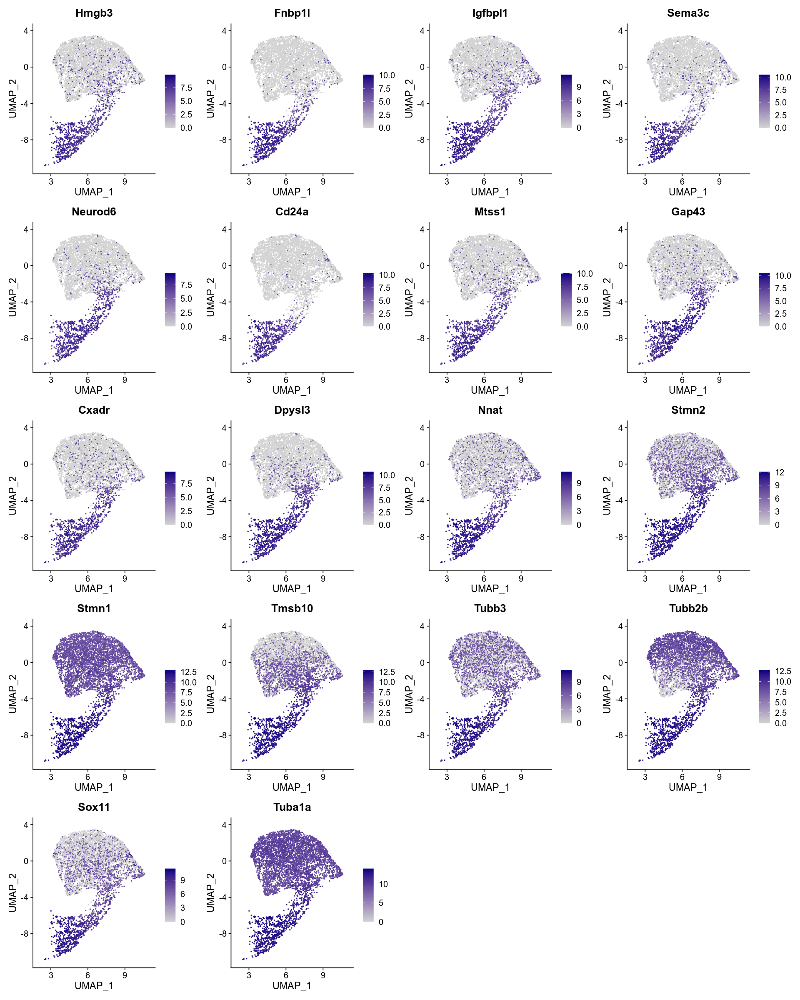

In [52]:
DefaultAssay(sro_gcs) = "logcounts"
options(repr.plot.width=16, repr.plot.height=20)
FeaturePlot(sro_gcs, features=nbt.list, ncol=4, cols=c("lightgrey","navy"))

In [6]:
imm.markers.up <- imm.markers %>% filter(p_val_adj<.0001 & avg_log2FC>0.5)
nrow(imm.markers.up)
imm.list = unique(c(rownames(top_n(imm.markers.up, -10, p_val_adj)),
    rownames(top_n(imm.markers.up, 10, avg_log2FC)),
    mutate(imm.markers.up, diff= pct.1-pct.2) %>% top_n(10,diff) %>% rownames()))
imm.list

[1] 14

[1] "Fxyd7"    "Tmem114"  "Tmem191c" "Necab3"   "Crtac1"   "Rasl10a" 
 [7] "Ogfrl1"   "Lin7a"    "Nav1"     "Slc1a2"   "Tesc"     "Apoe"    
[13] "Gm17322"

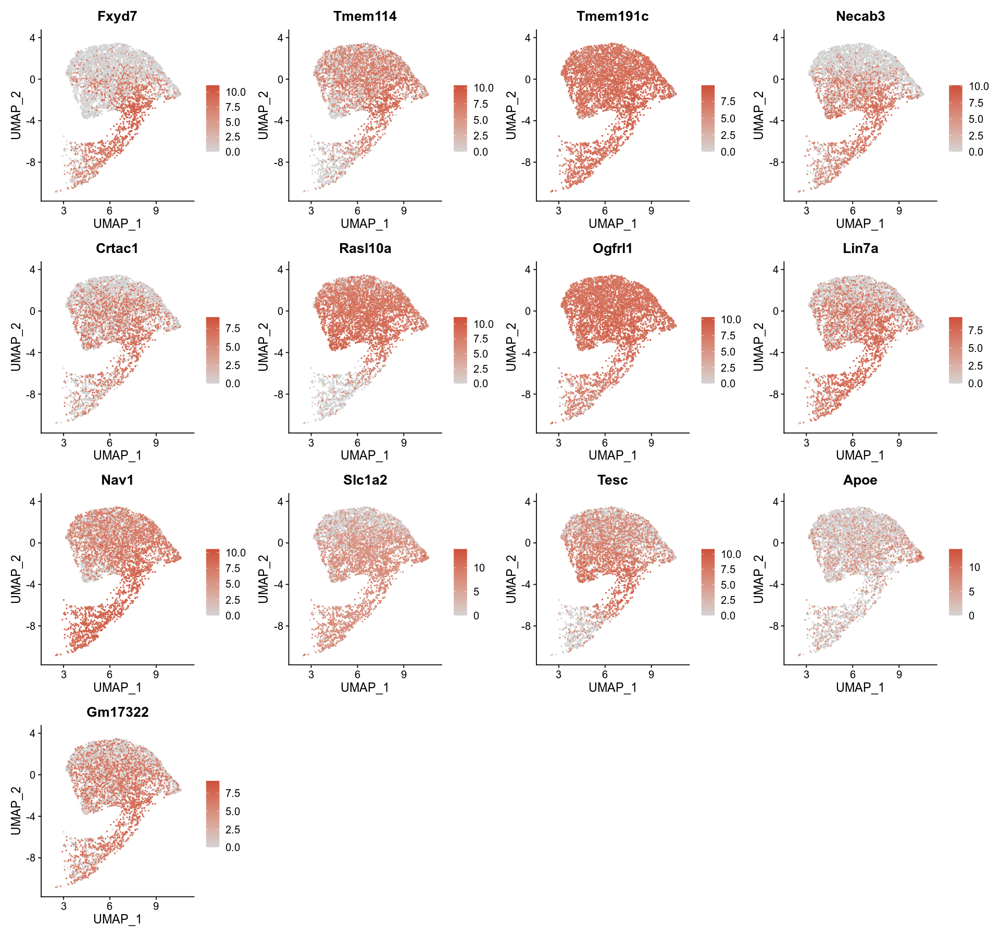

In [47]:
DefaultAssay(sro_gcs) = "logcounts"
options(repr.plot.width=16, repr.plot.height=15)
FeaturePlot(sro_gcs, features=imm.list, ncol=4, cols=c("lightgrey","tomato3"))

In [7]:
gc1.markers.up <- gc1.markers %>% filter(p_val_adj<.0001 & avg_log2FC>0.5)
nrow(gc1.markers.up)
gc1.list = unique(c(rownames(top_n(gc1.markers.up, -10, p_val_adj)),
    rownames(top_n(gc1.markers.up, 10, avg_log2FC)),
    mutate(gc1.markers.up, diff= pct.1-pct.2) %>% top_n(10,diff) %>% rownames()))
gc1.list

[1] 103

[1] "Arpc2"    "Atp1b1"   "Dgkz"     "Chst1"    "Calb1"    "Hpca"    
 [7] "Slc4a4"   "Sparcl1"  "Capza2"   "Ahcyl2"   "Arl6ip1"  "Ptk2b"   
[13] "Arhgap20" "Selenom"  "Rprml"    "Rapgef5"  "Pcp4"     "Akain1"  
[19] "Pip5k1b"  "Pmepa1"   "Fst"      "Fndc5"    "Bcl6"     "Il11ra1" 
[25] "Slit1"    "Il1r1"

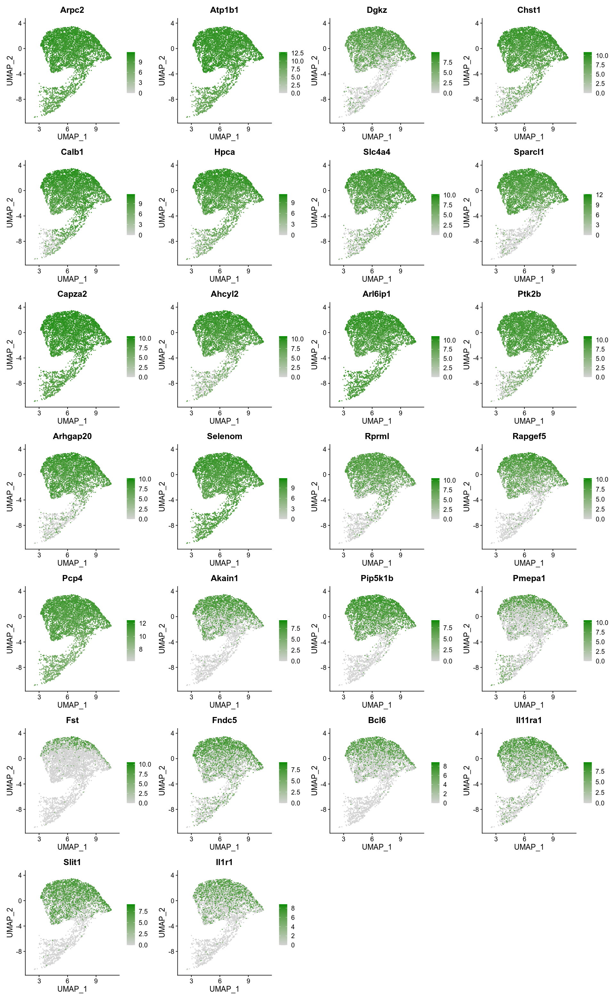

In [57]:
DefaultAssay(sro_gcs) = "logcounts"
options(repr.plot.width=16, repr.plot.height=26)
FeaturePlot(sro_gcs, features=gc1.list, ncol=4, cols=c("lightgrey","green4"))

In [8]:
syn.markers.up <- syn.markers %>% filter(p_val_adj<.0001 & avg_log2FC>0.5)
nrow(syn.markers.up)
syn.list = unique(c(rownames(top_n(syn.markers.up, -10, p_val_adj)),
    rownames(top_n(syn.markers.up, 10, avg_log2FC)),
    mutate(syn.markers.up, diff= pct.1-pct.2) %>% top_n(10,diff) %>% rownames()))
syn.list

[1] 137

[1] "Rgs4"    "Rasgrp1" "Chgb"    "Scg2"    "Nptx2"   "Syne1"   "Sgk1"   
 [8] "Nefm"    "Ntng1"   "Aldoa"   "tdt"     "Pcdh8"   "Penk"    "Mapk4"  
[15] "Kcnip3"  "Nrxn3"   "Trpc6"   "Acvr1c"  "Ttyh1"

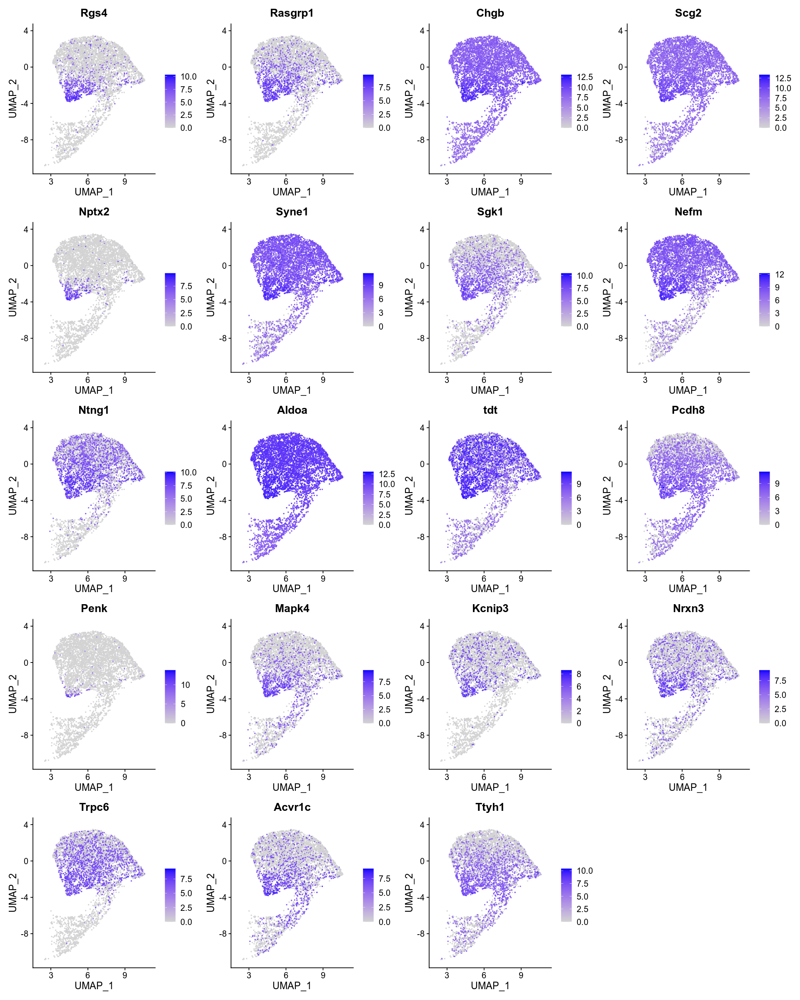

In [59]:
DefaultAssay(sro_gcs) = "logcounts"
options(repr.plot.width=16, repr.plot.height=20)
FeaturePlot(sro_gcs, features=syn.list, ncol=4)

In [8]:
df <- as.data.frame(rowSums(as.matrix(sro_gcs[['logcounts']]@counts)>=1, na.rm=TRUE)*100/dim(sro_gcs)[2])
names(df) <- c("per_cells_w_reads")
allprefilt <- rownames(filter(df, per_cells_w_reads>= 25))
length(allprefilt)

[1] 7904

In [11]:
length(intersect(rownames(nbt.markers.up), allprefilt))
length(intersect(rownames(imm.markers.up), allprefilt))
length(intersect(rownames(gc1.markers.up), allprefilt))
length(intersect(rownames(syn.markers.up), allprefilt))

[1] 484

[1] 14

[1] 102

[1] 117

In [12]:
nbt.list = intersect(nbt.list, allprefilt)
length(nbt.list)
imm.list = intersect(imm.list, allprefilt)
length(imm.list)
gc1.list = intersect(gc1.list, allprefilt)
length(gc1.list)
syn.list = intersect(syn.list, allprefilt)
length(syn.list)

[1] 12

[1] 13

[1] 25

[1] 15

In [63]:
uniques <- c(nbt.list, imm.list, gc1.list, syn.list)
length(uniques)

[1] 65

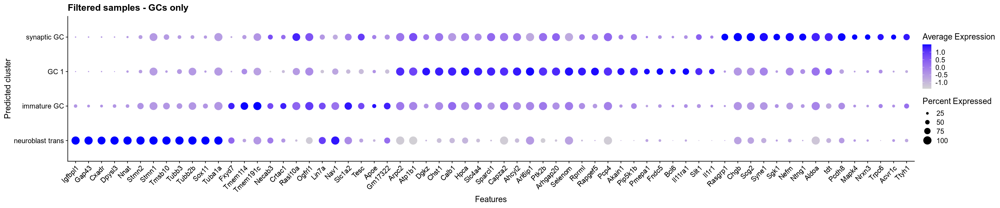

In [66]:
options(repr.plot.width=24, repr.plot.height=5)
DotPlot(sro_gcs, features=uniques, group.by="predicted.cluster")+
theme(axis.text.x=element_text(angle=45, hjust=1))+ggtitle("Filtered samples - GCs only")+labs(y="Predicted cluster")

# Step 5: GSEA

In [2]:
suppressPackageStartupMessages({
    library(org.Mm.eg.db)
    library(clusterProfiler)
    library(enrichplot)
})

In [14]:
sro_filt <- readRDS(here("processed-data","sro_filt_norm.rda"))
universe_entrez = mapIds(org.Mm.eg.db,
                    keys=rownames(sro_filt), #Column containing Ensembl gene ids
                    column="ENTREZID",
                    keytype="SYMBOL",
                    multiVals="first")
universe_entrez = universe_entrez[!is.na(universe_entrez)]
length(universe_entrez)

'select()' returned 1:1 mapping between keys and columns



[1] 19025

In [15]:
nbt.list1 = unique(c(rownames(top_n(nbt.markers.up, -10, p_val_adj)),
    rownames(top_n(nbt.markers.up, 10, avg_log2FC)),
    mutate(nbt.markers.up, diff= pct.1-pct.2) %>% top_n(10,diff) %>% rownames()))
length(nbt.list1)

[1] 134

In [16]:
imm_entrez = mapIds(org.Mm.eg.db,
                    keys=nbt.list1, #immat.list, #Column containing Ensembl gene ids
                    column="ENTREZID",
                    keytype="SYMBOL",
                    multiVals="first")
imm_entrez <- imm_entrez[!is.na(imm_entrez)]
length(imm_entrez)

'select()' returned 1:1 mapping between keys and columns



[1] 132

In [18]:
gc1_entrez = mapIds(org.Mm.eg.db,
                    keys=rownames(gc1.markers.up), #Column containing Ensembl gene ids
                    column="ENTREZID",
                    keytype="SYMBOL",
                    multiVals="first")
gc1_entrez <- gc1_entrez[!is.na(gc1_entrez)]
length(gc1_entrez)

'select()' returned 1:1 mapping between keys and columns



[1] 100

In [20]:
syn_entrez = mapIds(org.Mm.eg.db,
                    keys=rownames(syn.markers.up), #Column containing Ensembl gene ids
                    column="ENTREZID",
                    keytype="SYMBOL",
                    multiVals="first")
syn_entrez <- syn_entrez[!is.na(syn_entrez)]
length(syn_entrez)

'select()' returned 1:1 mapping between keys and columns



[1] 133

In [21]:
imm_entrez <- setdiff(imm_entrez, union(gc1_entrez, syn_entrez))
length(imm_entrez)
gc1_entrez <- setdiff(gc1_entrez, union(imm_entrez, syn_entrez))
length(gc1_entrez)
syn_entrez <- setdiff(syn_entrez, union(gc1_entrez, imm_entrez))
length(syn_entrez)

[1] 132

[1] 100

[1] 133

In [22]:
imm_results <- simplify(enrichGO(imm_entrez, "org.Mm.eg.db", 
                                 keyType = "ENTREZID", ont="BP", universe= universe_entrez, 
                                 pAdjustMethod="fdr"))
nrow(imm_results) #29

[1] 29

In [23]:
imm_results <- setReadable(imm_results, 'org.Mm.eg.db', 'ENTREZID')
imm_results@result

,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>
GO:0061564,GO:0061564,axon development,18/131,493/17477,2.936312e-08,6.462823e-05,5.718082e-05,Cntn2/Dcx/Bhlhe22/Cnr1/Svbp/Stmn1/Sema3c/Dpysl5/Crmp1/Casp3/Tubb3/Islr2/Rnd2/Mapt/Tubb2b/Gap43/Nrep/Shtn1,18
GO:0031346,GO:0031346,positive regulation of cell projection organization,16/131,426/17477,1.251380e-07,1.377143e-04,1.218449e-04,Dcx/Stmn2/Fnbp1l/Cnr1/Marcks/Cd24a/Fgfr1/Trim67/Islr2/Eef1a1/Rnd2/Mapt/Pik3r1/Cdc42ep3/Dpysl3/Shtn1,16
GO:0002181,GO:0002181,cytoplasmic translation,8/131,93/17477,4.796582e-07,3.519093e-04,3.113571e-04,Rpl39/Rplp0/Rpl18/Eef2/Rps26/Rpsa/Rpl10a/Rps28,8
GO:0042274,GO:0042274,ribosomal small subunit biogenesis,7/131,70/17477,9.160174e-07,5.040386e-04,4.459559e-04,Rps8/Rps5/Rps19/Rps24/Rpsa/Rps7/Rps28,7
GO:0000028,GO:0000028,ribosomal small subunit assembly,4/131,19/17477,1.070884e-05,3.367166e-03,2.979152e-03,Rps5/Rps19/Rpsa/Rps28,4
GO:0045664,GO:0045664,regulation of neuron differentiation,9/131,210/17477,2.933307e-05,7.844515e-03,6.940555e-03,Cntn2/Neurod1/Cd24a/Fgfr1/Rac3/Sox11/Rgs6/Nrep/Tcf4,9
GO:0010976,GO:0010976,positive regulation of neuron projection development,9/131,218/17477,3.930801e-05,8.651693e-03,7.654717e-03,Stmn2/Cnr1/Marcks/Cd24a/Fgfr1/Trim67/Eef1a1/Mapt/Dpysl3,9
GO:0021761,GO:0021761,limbic system development,6/131,91/17477,6.256311e-05,1.192017e-02,1.054655e-02,Neurod1/Dcx/Cntnap2/Neurod6/Fgfr1/Atat1,6
GO:0060174,GO:0060174,limb bud formation,3/131,11/17477,6.498956e-05,1.192017e-02,1.054655e-02,Sema3c/Sox4/Sox11,3


In [24]:
gc1_results <- simplify(enrichGO(gc1_entrez, "org.Mm.eg.db", 
                                 keyType = "ENTREZID", ont="BP", universe= universe_entrez, 
                                 pAdjustMethod="fdr"))
nrow(gc1_results) #32

[1] 32

In [25]:
gc1_results <- setReadable(gc1_results, 'org.Mm.eg.db', 'ENTREZID')
gc1_results@result

,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>
GO:0051258,GO:0051258,protein polymerization,11/97,273/17477,3.350041e-07,0.0004077320,0.0003683663,Arpc2/Capza2/Ptk2b/Iqgap2/Nckap1/Wasl/Capzb/Chmp4b/Gas7/Cotl1/Tubgcp2,11
GO:0043254,GO:0043254,regulation of protein-containing complex assembly,13/97,420/17477,5.537569e-07,0.0004077320,0.0003683663,Arpc2/Capza2/Ptk2b/Akain1/Iqgap2/Nckap1/Pmepa1/Cck/Wasl/Capzb/Cotl1/Sorl1/Hrk,13
GO:0030041,GO:0030041,actin filament polymerization,9/97,177/17477,6.082526e-07,0.0004077320,0.0003683663,Arpc2/Capza2/Ptk2b/Iqgap2/Nckap1/Wasl/Capzb/Gas7/Cotl1,9
GO:0060291,GO:0060291,long-term synaptic potentiation,7/97,108/17477,2.300715e-06,0.0009253477,0.0008360073,Calb1/Ptk2b/Rasgrf2/Adcy1/Prnp/Grin2a/Rgs14,7
GO:0030833,GO:0030833,regulation of actin filament polymerization,8/97,160/17477,3.000451e-06,0.0010056513,0.0009085577,Arpc2/Capza2/Ptk2b/Iqgap2/Nckap1/Wasl/Capzb/Cotl1,8
GO:2000310,GO:2000310,regulation of NMDA receptor activity,4/97,26/17477,1.213679e-05,0.0024407091,0.0022050637,Ptk2b/Rasgrf1/Rasgrf2/Grin2a,4
GO:0010038,GO:0010038,response to metal ion,9/97,269/17477,1.859971e-05,0.0028772328,0.0025994419,Hpca/Syt13/Prnp/Grin2a/Capn3/Cpne6/Anxa11/Nedd4l/Syt10,9
GO:0071248,GO:0071248,cellular response to metal ion,7/97,153/17477,2.282661e-05,0.0031808349,0.0028737318,Hpca/Syt13/Prnp/Grin2a/Capn3/Cpne6/Syt10,7
GO:0032409,GO:0032409,regulation of transporter activity,9/97,282/17477,2.698080e-05,0.0031808349,0.0028737318,Atp1b1/Hpca/Ptk2b/Rasgrf1/Rasgrf2/Prnp/Grin2a/Nedd4l/Cnih3,9


In [26]:
syn_results <- simplify(enrichGO(syn_entrez, "org.Mm.eg.db", 
                                 keyType = "ENTREZID", ont="BP", universe= universe_entrez, 
                                 pAdjustMethod="fdr"))
nrow(syn_results) #44

[1] 44

In [27]:
syn_results <- setReadable(syn_results, 'org.Mm.eg.db', 'ENTREZID')
syn_results@result

,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>
GO:0007611,GO:0007611,learning or memory,14/125,295/17477,2.562156e-08,2.842005e-05,2.418836e-05,Nptx2/Sgk1/Bdnf/Jun/Sorcs3/Nrxn3/Tanc1/Brinp1/Nr4a2/Ptprz1/Comt/Neto1/Synpo/Btg2,14
GO:0007612,GO:0007612,learning,11/125,173/17477,4.544321e-08,2.842005e-05,2.418836e-05,Nptx2/Sgk1/Bdnf/Jun/Sorcs3/Nrxn3/Tanc1/Comt/Neto1/Synpo/Btg2,11
GO:1901214,GO:1901214,regulation of neuron death,15/125,362/17477,4.773750e-08,2.842005e-05,2.418836e-05,Nefl/Bdnf/Jun/Kcnip3/Cebpb/Eno2/Nr4a2/Ptprz1/Tgfb2/Fbxw7/Hsph1/Btg2/Npy/Fos/Mt1,15
GO:0050808,GO:0050808,synapse organization,17/125,475/17477,4.858128e-08,2.842005e-05,2.418836e-05,Ntng1/Nefl/Bdnf/Pcdh8/Nrxn3/Atp2b2/Cnksr2/Malat1/Tanc1/Nptxr/Pcdh17/Dgkb/Adgrb1/Myo5b/Gabra1/Synpo/Adgrl3,17
GO:0051146,GO:0051146,striated muscle cell differentiation,13/125,284/17477,1.264949e-07,4.933302e-05,4.198744e-05,Rgs4/Mylk3/Bdnf/Klhl40/Trip10/Tanc1/Plekho1/Cxcl12/Tmod1/Bhlhe41/Adgrb1/Rgs2/Tnnt2,13
GO:0070997,GO:0070997,neuron death,15/125,402/17477,1.864485e-07,6.232706e-05,5.304669e-05,Nefl/Bdnf/Jun/Kcnip3/Cebpb/Eno2/Nr4a2/Ptprz1/Tgfb2/Fbxw7/Hsph1/Btg2/Npy/Fos/Mt1,15
GO:0043523,GO:0043523,regulation of neuron apoptotic process,12/125,262/17477,3.935002e-07,1.150988e-04,9.796083e-05,Nefl/Bdnf/Jun/Kcnip3/Cebpb/Nr4a2/Ptprz1/Tgfb2/Fbxw7/Hsph1/Btg2/Mt1,12
GO:0010035,GO:0010035,response to inorganic substance,15/125,439/17477,5.724117e-07,1.425735e-04,1.213446e-04,Nefl/Jun/Kcnip3/Trpc6/Jund/Nr4a2/Net1/Junb/Pam/Hsph1/Kcna1/Tnnt2/Pgam2/Fos/Mt1,15
GO:0051402,GO:0051402,neuron apoptotic process,12/125,293/17477,1.284476e-06,2.504729e-04,2.131780e-04,Nefl/Bdnf/Jun/Kcnip3/Cebpb/Nr4a2/Ptprz1/Tgfb2/Fbxw7/Hsph1/Btg2/Mt1,12


In [28]:
#select top 10 non-redundant terms from each
imm_results2 <- imm_results
imm_results2@result <- imm_results2@result[c(1:8,11,12),]
gc1_results2 <- gc1_results
gc1_results2@result <- gc1_results2@result[c(2,3,4,6,7,9,11,12,13,16),]
syn_results2 <- syn_results
syn_results2@result <- syn_results2@result[c(1,3,4,8,10,14,17,18,19,20),]

In [29]:
comb_results <- merge_result(list("immature"=imm_results2, "growth"=gc1_results2, "synaptic"=syn_results2))

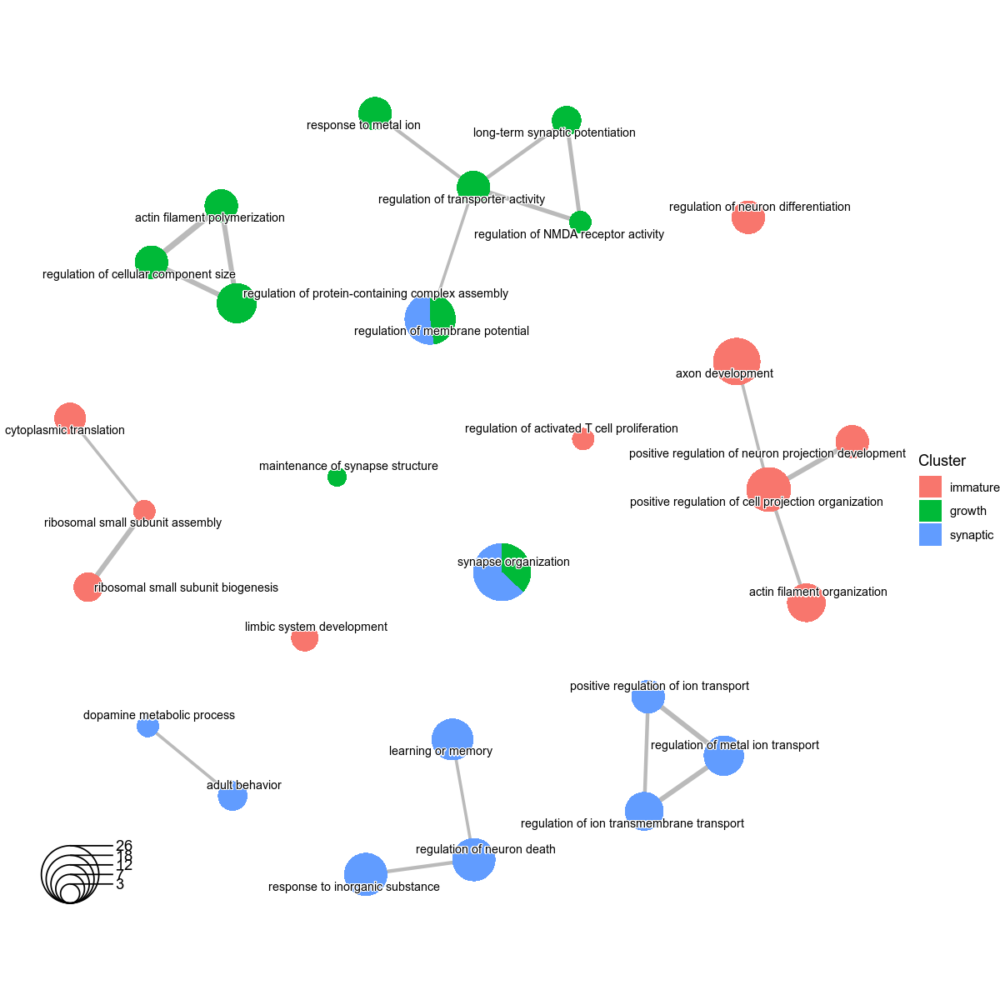

In [32]:
comb_results <- pairwise_termsim(comb_results)
options(repr.plot.width=10, repr.plot.height=10)
emapplot(comb_results, showCategory=100, node_scale=1, node_label="category", layout="fr", pie="Count")

In [35]:
comb_results2 <- merge_result(list("immature"=imm_results, "growth"=gc1_results, "synaptic"=syn_results))
comb_results2 <- pairwise_termsim(comb_results2)

Warning message:
“ggrepel: 3 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


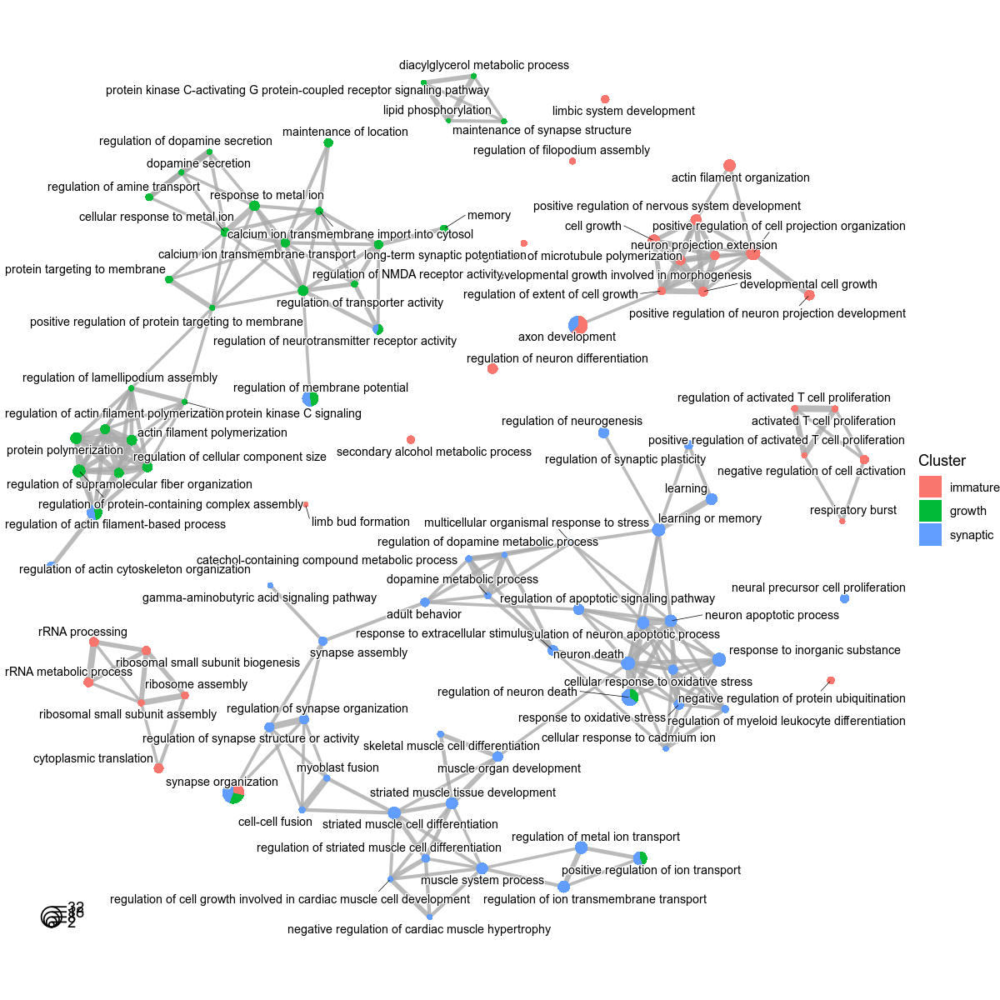

In [36]:
emapplot(comb_results2, showCategory=100, node_scale=1, node_label="category", layout="fr", pie="Count")

# Step 6: pseudotime

In [3]:
suppressPackageStartupMessages({
    library(slingshot)
    library(igraph)
    library(scater)
    library(tradeSeq)
})

In [54]:
sca_sro <- MAST::FromMatrix(list(counts=sro_gcs$SCT@data,
                                 norm=sro_gcs$CPM@counts,
                                 logcounts= sro_gcs$logcounts@counts),
                            cData= sro_gcs@meta.data)

`cData` has no wellKey.  I'll make something up.

Assuming data assay in position 3, with name logcounts is log-transformed.



In [55]:
reducedDim(sca_sro, "UMAP") <- sro_gcs@reductions$umap@cell.embeddings
reducedDim(sca_sro, "PCA") <- calculatePCA(sca_sro)

In [56]:
sca_sro_pca = slingshot(sca_sro, clusterLabels="predicted.cluster", start.clus="neuroblast trans", 
                         reducedDim="PCA")
SlingshotDataSet(sca_sro_pca)

Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”


class: SlingshotDataSet 

 Samples Dimensions
    5537         50

lineages: 1 
Lineage1: neuroblast trans  immature GC  GC 1  synaptic GC  

curves: 1 
Curve1: Length: 166.68	Samples: 5537

In [47]:
sca_sro_pca_umap <- embedCurves(sca_sro_pca, reducedDim(sca_sro_pca, "UMAP"))

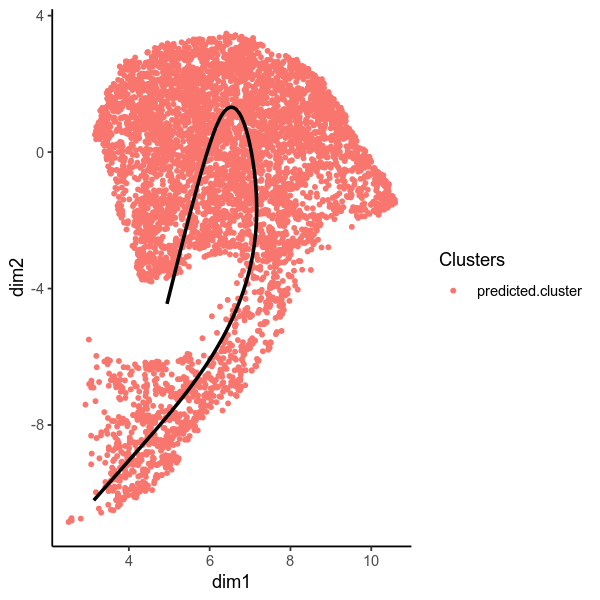

In [51]:
options(repr.plot.width=5, repr.plot.height=5)
plotGeneCount(sca_sro_pca_umap, clusters="predicted.cluster")#colData(sca_srt_pca)$sling_lineage_rnd)

In [57]:
colData(sca_sro_pca)$pseudo1_bin = cut(colData(sca_sro_pca)$slingPseudotime_1, breaks=100,
                                       include.lowest=TRUE, labels=FALSE)

df1 = as.data.frame(colData(sca_sro_pca)[,c("pseudo1_bin", "predicted.cluster")]) %>%
group_by(pseudo1_bin, predicted.cluster) %>% tally() 
head(df1)

pseudo1_bin,predicted.cluster,n
<int>,<fct>,<int>
1,neuroblast trans,2
3,neuroblast trans,8
4,neuroblast trans,18
5,neuroblast trans,31
6,neuroblast trans,47
7,neuroblast trans,44


In [80]:
test.x = cut(colData(sca_sro_pca)$slingPseudotime_1, breaks=100,
                                       include.lowest=TRUE)
levels(test.x)
length(levels(test.x))

[1] "[-0.167,1.67]" "(1.67,3.33]"   "(3.33,5]"      "(5,6.67]"     
  [5] "(6.67,8.33]"   "(8.33,10]"     "(10,11.7]"     "(11.7,13.3]"  
  [9] "(13.3,15]"     "(15,16.7]"     "(16.7,18.3]"   "(18.3,20]"    
 [13] "(20,21.7]"     "(21.7,23.3]"   "(23.3,25]"     "(25,26.7]"    
 [17] "(26.7,28.3]"   "(28.3,30]"     "(30,31.7]"     "(31.7,33.3]"  
 [21] "(33.3,35]"     "(35,36.7]"     "(36.7,38.3]"   "(38.3,40]"    
 [25] "(40,41.7]"     "(41.7,43.3]"   "(43.3,45]"     "(45,46.7]"    
 [29] "(46.7,48.3]"   "(48.3,50]"     "(50,51.7]"     "(51.7,53.3]"  
 [33] "(53.3,55]"     "(55,56.7]"     "(56.7,58.3]"   "(58.3,60]"    
 [37] "(60,61.7]"     "(61.7,63.3]"   "(63.3,65]"     "(65,66.7]"    
 [41] "(66.7,68.3]"   "(68.3,70]"     "(70,71.7]"     "(71.7,73.3]"  
 [45] "(73.3,75]"     "(75,76.7]"     "(76.7,78.3]"   "(78.3,80]"    
 [49] "(80,81.7]"     "(81.7,83.3]"   "(83.3,85]"     "(85,86.7]"    
 [53] "(86.7,88.3]"   "(88.3,90]"     "(90,91.7]"     "(91.7,93.3]"  
 [57] "(93.3,95]"     "(95,96.7]"     "(96.7,98.3]"   "(98.3,100]"   
 [61] "(100,102]"     "(102,103]"     "(103,105]"     "(105,107]"    
 [65] "(107,108]"     "(108,110]"     "(110,112]"     "(112,113]"    
 [69] "(113,115]"     "(115,117]"     "(117,118]"     "(118,120]"    
 [73] "(120,122]"     "(122,123]"     "(123,125]"     "(125,127]"    
 [77] "(127,128]"     "(128,130]"     "(130,132]"     "(132,133]"    
 [81] "(133,135]"     "(135,137]"     "(137,138]"     "(138,140]"    
 [85] "(140,142]"     "(142,143]"     "(143,145]"     "(145,147]"    
 [89] "(147,148]"     "(148,150]"     "(150,152]"     "(152,153]"    
 [93] "(153,155]"     "(155,157]"     "(157,158]"     "(158,160]"    
 [97] "(160,162]"     "(162,163]"     "(163,165]"     "(165,167]"

[1] 100

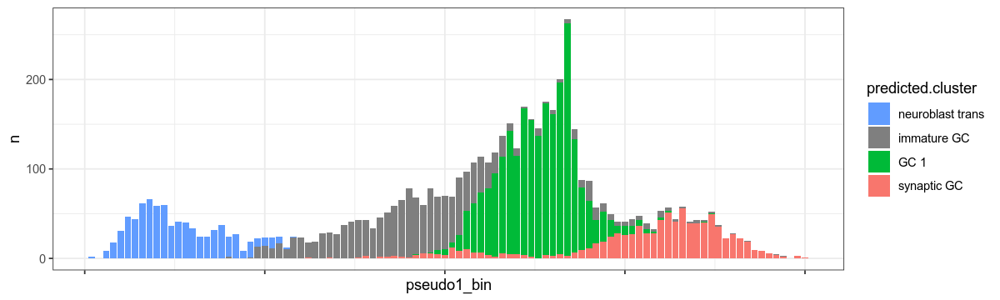

In [56]:
options(repr.plot.width=10, repr.plot.height=3)
ggplot(df1, aes(x=pseudo1_bin, y=n, fill=predicted.cluster))+
geom_bar(stat="identity")+
scale_fill_manual(values=c("#619CFF","grey50","#00BA38","#F8766D"))+
theme_bw()+theme(axis.text.x=element_blank())

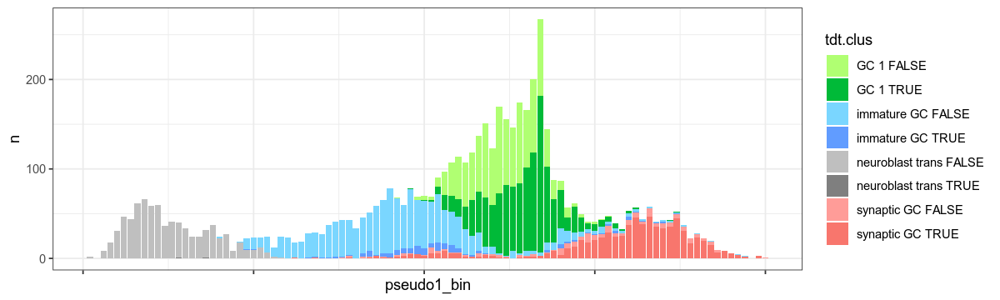

In [59]:
df2 = as.data.frame(colData(sca_sro_pca)[,c("pseudo1_bin", "predicted.cluster", "tdT")]) %>% 
mutate(tdt.clus = paste(predicted.cluster, tdT)) %>%
group_by(pseudo1_bin, tdt.clus) %>% tally() 

options(repr.plot.width=10, repr.plot.height=3)
ggplot(df2, aes(x=pseudo1_bin, y=n, fill=tdt.clus))+
geom_bar(stat="identity")+
scale_fill_manual(values=c("#B0FF72","#00BA38",
                           "#7AD6FF","#619CFF",
                           "grey75","grey50",
                           "#FF9C98", "#F8766D"))+
theme_bw()+theme(axis.text.x=element_blank())

In [105]:
pseudo.bin.df = as.data.frame(colData(sca_sro_pca)[,c("pseudo1_bin", "predicted.cluster", "tdT")]) %>% 
mutate(tdT.clus= paste(predicted.cluster, tdT)) %>%
group_by(pseudo1_bin, tdT.clus) %>% tally() %>%
tidyr::pivot_wider(names_from="tdT.clus", values_from="n", values_fill=0)

In [106]:
setdiff(1:100, pseudo.bin.df$pseudo1_bin)
pseudo.bin.df <- add_row(ungroup(pseudo.bin.df), pseudo1_bin=c(2,98))
pseudo.bin.df[99,2:9] = 0
pseudo.bin.df[100,2:9] = 0
pseudo.bin.df = arrange(pseudo.bin.df, pseudo1_bin) %>% mutate(pseudo1_range=levels(test.x))
pseudo.bin.df = pseudo.bin.df[,c(1,10,2:5,8:9,6:7)]

[1]  2 98

In [107]:
pseudo.bin.df

pseudo1_bin,pseudo1_range,neuroblast trans FALSE,neuroblast trans TRUE,immature GC FALSE,immature GC TRUE,GC 1 FALSE,GC 1 TRUE,synaptic GC TRUE,synaptic GC FALSE
<dbl>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,"[-0.167,1.67]",2,0,0,0,0,0,0,0
2,"(1.67,3.33]",0,0,0,0,0,0,0,0
3,"(3.33,5]",8,0,0,0,0,0,0,0
4,"(5,6.67]",18,0,0,0,0,0,0,0
5,"(6.67,8.33]",31,0,0,0,0,0,0,0
6,"(8.33,10]",47,0,0,0,0,0,0,0
7,"(10,11.7]",44,0,0,0,0,0,0,0
8,"(11.7,13.3]",62,0,0,0,0,0,0,0
9,"(13.3,15]",66,0,0,0,0,0,0,0


In [108]:
write.csv(pseudo.bin.df, here("results","pseudo-bin_hist_values.csv"))

In [58]:
colData(sca_sro)$slingPseudotime_1 = colData(sca_sro_pca)$slingPseudotime_1
colData(sca_sro)$pseudo1_bin = cut(colData(sca_sro_pca)$slingPseudotime_1, breaks=100,
                                   include.lowest=TRUE, labels=FALSE)

In [24]:
saveRDS(sca_sro, here("processed-data","sca_sro.rda"))
(sca_sro_filt = sca_sro[allprefilt,])
saveRDS(sca_sro_filt, here("processed-data","sca_sro_prefilt.rda"))

class: SingleCellAssay 
dim: 7904 5537 
metadata(0):
assays(3): counts norm logcounts
rownames(7904): Xkr4 Mrpl15 ... AC149090.1 tdt
rowData names(1): primerid
colnames(5537): AAACGCTAGGCTTTCA AAACGCTGTCACCACG ... TTTGTTGCAAATGAAC
  TTTGTTGGTAGAATAC
colData names(29): orig.ident nCount_RNA ... slingPseudotime_1
  pseudo1_bin
reducedDimNames(2): UMAP PCA
mainExpName: NULL
altExpNames(0):

In [3]:
set.seed(42)
df1 <- slice_sample(as.data.frame(colData(sca_sro)),prop=.2)
table(df1[,c("Age_group","tdT")])

         tdT
Age_group FALSE TRUE
       14   200   29
       20   254  153
       24   223  248

In [4]:
ks.test(filter(df1, Age_group==14, tdT==TRUE)$slingPseudotime_1,
        filter(df1, Age_group==14, tdT==FALSE)$slingPseudotime_1,
       alternative="two.sided")
ks.test(filter(df1, Age_group==20, tdT==TRUE)$slingPseudotime_1,
        filter(df1, Age_group==20, tdT==FALSE)$slingPseudotime_1,
       alternative="two.sided")
ks.test(filter(df1, Age_group==24, tdT==TRUE)$slingPseudotime_1,
        filter(df1, Age_group==24, tdT==FALSE)$slingPseudotime_1,
       alternative="two.sided")

Warning message in ks.test(filter(df1, Age_group == 14, tdT == TRUE)$slingPseudotime_1, :
“cannot compute exact p-value with ties”



	Two-sample Kolmogorov-Smirnov test

data:  filter(df1, Age_group == 14, tdT == TRUE)$slingPseudotime_1 and filter(df1, Age_group == 14, tdT == FALSE)$slingPseudotime_1
D = 0.74707, p-value = 1.054e-12
alternative hypothesis: two-sided


Warning message in ks.test(filter(df1, Age_group == 20, tdT == TRUE)$slingPseudotime_1, :
“p-value will be approximate in the presence of ties”



	Two-sample Kolmogorov-Smirnov test

data:  filter(df1, Age_group == 20, tdT == TRUE)$slingPseudotime_1 and filter(df1, Age_group == 20, tdT == FALSE)$slingPseudotime_1
D = 0.50888, p-value < 2.2e-16
alternative hypothesis: two-sided


Warning message in ks.test(filter(df1, Age_group == 24, tdT == TRUE)$slingPseudotime_1, :
“p-value will be approximate in the presence of ties”



	Two-sample Kolmogorov-Smirnov test

data:  filter(df1, Age_group == 24, tdT == TRUE)$slingPseudotime_1 and filter(df1, Age_group == 24, tdT == FALSE)$slingPseudotime_1
D = 0.46492, p-value < 2.2e-16
alternative hypothesis: two-sided


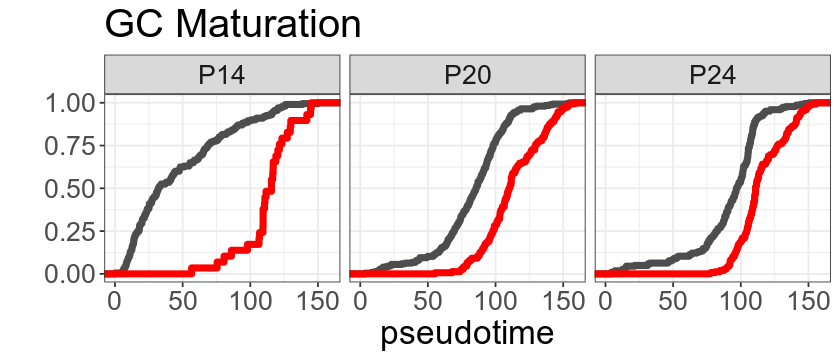

In [8]:
options(repr.plot.width=7, repr.plot.height=3)
ggplot(df1, aes(slingPseudotime_1, color=tdT))+
stat_ecdf(size=2)+
#stat_ecdf(aes(x=slingPseudotime_2, linetype="L1"),alpha=.7,size=2)+
scale_color_manual(values=c("grey30","red"))+
facet_grid(cols=vars(age))+#, rows=vars(tdT))+
labs(x="pseudotime",y="", color="tdT", title="GC Maturation")+
theme_bw()+#xlim(-4.2,1.5)+
theme(text=element_text(size=20),
     legend.position="none")

In [112]:
ecdf2.df = df1[,c("age","tdT","slingPseudotime_1")]
write.csv(ecdf2.df, here("results","select-gcs_tdT-age-ecdf_pseudotime-values.csv"))

,age,tdT,slingPseudotime_1
,<chr>,<lgl>,<dbl>
CGCCATTGTATGACAA,P20,FALSE,110.141209
CGCCAGACATTGTCGA,P24,FALSE,110.180985
AGAGAGCGTTCGTAAC,P20,TRUE,129.060291
TGCGGCATCAGTCACA,P24,FALSE,105.518298
TTGAGTGTCAATGTCG,P14,FALSE,20.059279
AGACTCACAGAGCCCT,P20,FALSE,98.144432
GCCAGCACAAGGGTCA,P14,FALSE,65.474757
TGATGCATCAGCACCG,P20,FALSE,88.182719
TGATTTCAGGGCTGAT,P24,FALSE,118.218910


In [ ]:
fun1 <- ecdf(sro_filt$SCT@data["tdt",])
ecdf.df = as.data.frame(cbind("fnx"=fun1(sro_filt$SCT@data["tdt",]),"tdT_raw"=sro_filt$SCT@data["tdt",])) %>%
group_by(fnx) %>% summarise(tdT_expr=min(tdT_raw), n_cells=n())
write.csv(ecdf.df, here("results","tdT-ecdf_x_y_values.csv"))

## ARGs

In [ ]:
args <- read.csv(here("tools","args_list.csv"))

In [10]:
filter(args, na_sums>1) %>% nrow() #241
argset = filter(args, na_sums>1 & Gene %in% allprefilt) %>% pull(Gene)
length(argset)

[1] 241

[1] 107

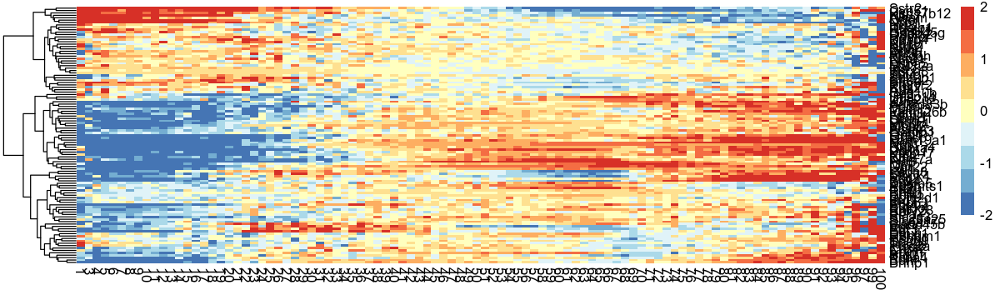

In [17]:
options(repr.plot.width=10, repr.plot.height=3)
plotGroupedHeatmap(sca_sro, features=argset, exprs.values="logcount",
                   group="pseudo1_bin", border_color=NA,
                   cluster_cols=FALSE, cluster_rows=TRUE,
                   center=TRUE, zlim=c(-2,2))

In [22]:
list1 = list("nbt"=rownames(nbt.markers.up), "gc1"=rownames(gc1.markers.up),
             "syn"=rownames(syn.markers.up))
lapply(list1, intersect, y=argset)

$nbt
[1] "Tpt1"  "Sstr2" "Kitl"  "Nrp1"  "Cyp51" "Odc1"  "Ina"  

$gc1
[1] "Nrn1"  "Pls3"  "Kdm7a"

$syn
 [1] "Scg2"     "Sgk1"     "Nefl"     "Bdnf"     "Mapk4"    "Pcdh8"   
 [7] "Grasp"    "Klhl2"    "Brinp1"   "Fam126b"  "Ier5"     "Junb"    
[13] "Pcdh17"   "Ankrd33b" "Gabra4"   "Pam"      "Hsph1"    "Rgs2"    
[19] "Btg2"     "Vgf"      "Mt1"

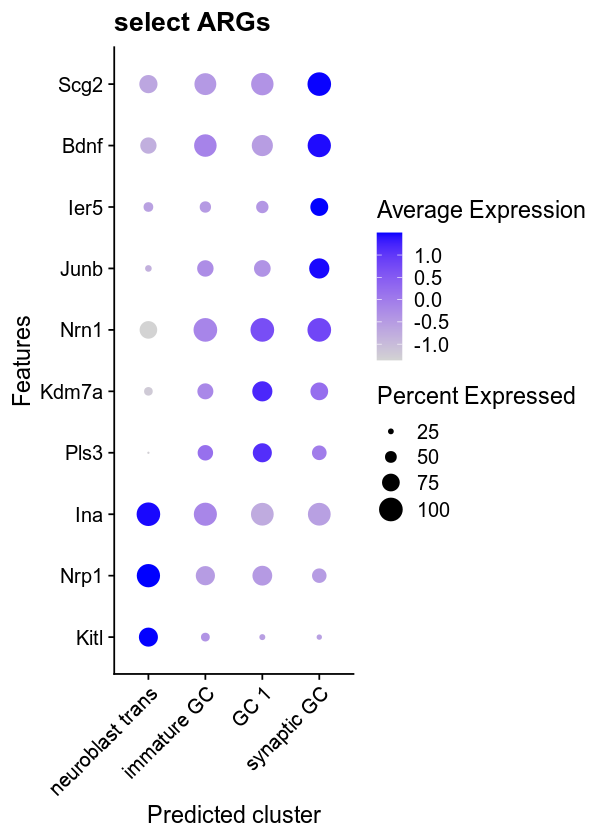

In [23]:
options(repr.plot.width=5, repr.plot.height=7)
DotPlot(sro_gcs, features=c("Kitl","Nrp1","Ina",
                            "Pls3","Kdm7a","Nrn1",
                            "Junb","Ier5","Bdnf","Scg2"), group.by="predicted.cluster")+
       #cols=c("royalblue","red3"))+ 
theme(axis.text.x=element_text(angle=45, hjust=1))+ggtitle("select ARGs")+labs(y="Predicted cluster")+
coord_flip()